# Finding a Neighbourhood to Call Home

This notebook forms the basis for my Data Science Capstone Project - Reid J.C., 2020-06-30

---

### Table of Contents:

  1. Introduction
  2. Data
  3. Methodology
  4. Results
  5. Discussion
  6. Conclusion
  
---

## 1. Introduction: 

### 1.1 Background

A young couple have finished school and have been saving money while living in a small apartment. The couple is looking to move to the western edge of Lake Ontario, because they know they don't want to live in the heart of Toronto, and they also have family in the GTHA (Greater Toronto and Hamilton Area). They're looking into buying a house, but are overwhelmed due to the significant number of important factors required to narrow down the regions that they should invest their time and energy into to explore further. As a young couple, they are interested in the notion of future kids being able to walk to school, as well as nearby daycare centres being available since both adults are employed. The couple is also highly interested in being able to enjoy their local neighbourhood's outdoor and recreational activites, but they find it difficult to explore this in a time-efficient manner and have so far been overwhelmed looking at city directories and Google Maps.

### 1.2 Problem Description

Purchasing a house is a significant investment, and there are many big decisions to make and many unknowns to uncover prior to signing a mortgage.
   * What city should they live in?
   * What is the composition of each city?
   * Where are the neighbourhoods within each city?
   * What types of neighbourhoods offer the amenities they are interested in?
   * Which neighbourhoods are similar to each other?

The couple is looking for a potential neighbourhod to move into that will continue to provide local activities for them and potential future kids and looking into neighbourhoods within west Hamilton, Burlington, Oakville, and Mississauga. The couple want daycare and elementary schools to be local, as well as a high diversity of outdoor and athletic facilities. The couple have a lot of outdoor facilities and athletic facilities in mind that they are interested in, including:
   * Playground			   
   * Bike Trail			   
   * Beach			    	
   * Botanical Garden		
   * Dog Run				 
   * Fishing Spot			
   * Lake			    	 
   * Nature Preserve		   
   * Park					 
   * Pool		 
   * Boxing Gym			  
   * Climbing Gym			
   * Cycle Studio			 	
   * Gyms					  
   * Martial Arts Dojo	    
   * Outdoor Gym			
   * Pilates Studio		   
   * Track				    
   * Yoga Studio			 
   * Indoor Play Area		
   * Recreation Center	

A search of this magnitude (eg. 4 cities and many neighbourhoods within them, across so many different types of amenities, and factoring in geolocation) would take up an extraordinary amount of time to individually search per neighbourhood and manually comb the results (i.e. Google searches). Therefore, the couple are looking for a data science approach that could help them pin-point the neighbourhoods that offer the amenities they are interested in, as well as the neighbourhoods based on the diversity and quantity of amenities offered. Furthermore, the couple is interested in knowing generally which neighbourhoods are more and less similar to each other based on these amenities.

### 1.3 Target Audience

This problem is relevant to other couples and young adults in similar stages of life, who for personal reasons are interested in the communities to the west of Toronto, Ontario, Canada. However, this type of analysis could be adapted by anyone looking to find a desirable neighbourhood, by adapting he search criteria to suit their own personal preferences.

---

## 2. Data

### 2.1 Neighbourhood names and geolocations 
Unfortunately, the Wikipedia page for the neighbourhood and postal code information for this region is incompletely annotated;
https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_L. However, the following database,
https://www.postalpinzipcodes.com/Postcode-CAN-Canada-Postal-code-L9K-ZIP-Code, is available to curate this information for the following cities: Hamilton (west), Burlington, Oakville, and Mississauga. Conveniently, neighbourhoods are grouped by postal code so as to have roughly even neighbourhoods areas. Two small postal code areas were joined (i.e. Burlington Central and Maple regions) into one neighbourhood, since they are both relatively small territories. The neighbourhood of Malton was excluded from Mississauga due to the highly urban location of this neighbourhood and proximity to the airport. After preprocessing the data using the aforementioned descriptions, 35 distinct neighbourhoods were  assembled and used for subsequent analysis.

In [254]:
import types
import pandas as pd
import numpy as np
# The next line is hidden as it contains user credentials for loading the file

In [111]:
# The code was removed by Watson Studio for sharing.

In [112]:
city_df = pd.read_csv(body)
city_df

,City,Neighbourhood,Postal_code,Latitude,Longitude
0,Mississauga,"Applewood, Dixie",L4Y,43.602800,-79.592900
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.619200,-79.653800
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400
5,Mississauga,Lakeview,L5E,43.583600,-79.561000
6,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200
7,Mississauga,"Lorne Park, West Port Credit",L5H,43.541900,-79.616400
8,Mississauga,"Park Royal, Clarkson, Birchwood, Rattray Park ...",L5J,43.510200,-79.629600
9,Mississauga,"Sheridan Homelands, Sherwood Forest",L5K,43.527200,-79.661700


### 2.2 Foursquare data

Foursquare offers customizable searches based on a particular type of venue, which is codified using a category ID. The category ID's for various establishments are available from Foursquare here: https://developer.foursquare.com/docs/build-with-foursquare/categories/. 

### 2.3 The couple's neighbourhood criteria is: 
   1. Must have local daycare or child care service 
   2. Must have local elementary school 
   3. Local fitness amenities, i.e. gyms, pools, dojo, studios; and outdoor amenities, i.e. trails, parks, dog run, fishing, playground, etc.
   
Therefore, sequential calls to the Foursquare API will be used to generate the data for the following:
   1. day care '5744ccdfe4b0c0459246b4c7' 
   2. elementary school '4f4533804b9074f6e4fb0105'
   3. outdoors and recreation '4d4b7105d754a06377d81259'
   
The data will be manipulated using pandas and numpy packages in python. Neighbourhoods will be removed if they do not have a day care or elementary school within 1000 metres of their neighbourhood's geolocation, which will be confirmed using map visualization packages (folium) to represent the middle of the centre of the neighbourhood. Then, neighbourhoods will be evaluated for outdoor and recreation amenities. They will be ranked by both quantity and diversity, and clustered (K Means clustering) to evaluate neighbourhoods that are similar in the types of outdoor and recreation activites they offer. Map visualization packages will be used to identify similar neighbourhoods, as well as the highly desirable neighbourhoods based on the couple's criteria.


---

## 3. Methodology

### 3.1 Analytical Approach

Here I describe the main components of the report and the exploratory data analysis performed, including: inferential statistical testing and machine learning techniques used.  
  
The inital exploratory analysis is called from the Foursquare API as described below. Briefly, the neighbourhoods are evaluated for the precense of daycare centres, and then elementary schools. If a neighbourhood does not have one or the other amenitiy, is is removed. Then, a wide array of recreational and outdoor facilities were investogated for the remaining neighbourhoods.
  
Principal component analysis (PCA) was used to cluster the neighbourhoods based on recreational facility frequency distributions. PCA was used to determine the number of groups that would be suitable for K Means clustering, which was then performed. The clusters with the highest average number of recreational facilities and most desirable facilties were then further evaluted for martial arts dojos using Foursquare data. The remaining neighbourhoods are shown in the Results section and their key characteristics are described.

### 3.2 Exploratory Analysis of the Neighbourhoods

Some neighbourhoods are large enough to be a town (i.e. Dundas), while others are collections of neighbourhoods, which will be both considered 'neighbourhoods for this analysis'. Each neighbourhood is represented by a single postal code.

In [4]:
df = city_df['City'].value_counts()
df

Mississauga      16
West Hamilton     8
Burlington        6
Oakville          5
Name: City, dtype: int64

### Visualize the neighborhoods on a map

In [281]:
#!conda install -c conda-forge folium=0.5.0 --yes 
!pip install Folium
import folium
print('Folium installed')

Folium installed


In [105]:
map_goldenhorseshoe_1 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')
map_goldenhorseshoe_1

In [17]:
# Add labels for each neighbourhood to the map
for lat, lng, city, neighborhood in zip(city_df['Latitude'], city_df['Longitude'], city_df['City'], city_df['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=4,popup=label,color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_goldenhorseshoe_1)  
map_goldenhorseshoe_1

### 3.3 Foursquare Venues
The couple have several criteria for their neighbourhood: 
   1. Must have local daycare or child care service 
   2. Must have local elementary school 
   
The neighbourhoods remaining will then be ranked on the quality of:
   
   3. Local fitness amenities, i.e. gyms, pools, dojo, studios
   4. Local outdoor amenities, i.e. trails, parks, dog run, fishing, playground
   
The next line is hidden as it contains the Foursquare Client ID and password 

In [40]:
# The code was removed by Watson Studio for sharing.

In [41]:
import json 
import requests 
from pandas.io.json import json_normalize

In [42]:
def getNearbyVenues(names, latitudes, longitudes, radius=2500):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT)    
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([(name,lat,lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood','Neighborhood Latitude','Neighborhood Longitude', 
                  'Venue','Venue Latitude','Venue Longitude','Venue Category']
    return(nearby_venues)

In [43]:
# Get the nearby venues for each neighbourhood
LIMIT = 100
city_venues = getNearbyVenues(names=city_df['Neighbourhood'],latitudes=city_df['Latitude'],longitudes=city_df['Longitude'])

In [44]:
print(city_venues.shape)
city_venues.to_csv('city_venues_output.csv', index=False)
city_venues.head()

(2630, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Applewood, Dixie",43.6028,-79.5929,Tavora Foods,43.601842,-79.591841,Supermarket
1,"Applewood, Dixie",43.6028,-79.5929,Holy Smokez BBQ Sandwiches,43.603964,-79.590033,BBQ Joint
2,"Applewood, Dixie",43.6028,-79.5929,Big Al's Fish Store,43.597933,-79.595799,Pet Store
3,"Applewood, Dixie",43.6028,-79.5929,Istanbul Kebab House,43.608773,-79.584128,Kebab Restaurant
4,"Applewood, Dixie",43.6028,-79.5929,Pho-Com 99,43.610421,-79.586591,Vietnamese Restaurant


#### Add a yellow dot on the map for every venue called from Foursquare
Limit of 200 venues per neighbourhood

In [62]:
for lat, lng, venue, neighborhood in zip(city_venues['Venue Latitude'], city_venues['Venue Longitude'], city_venues['Venue Category'], city_venues['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='yellow',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_1)  
map_goldenhorseshoe_1

### 3.4 Exploratory Analysis continued: Investigate Daycare and Childcare centres listed in Foursquare

#### Is daycare and child care represented in top venues?

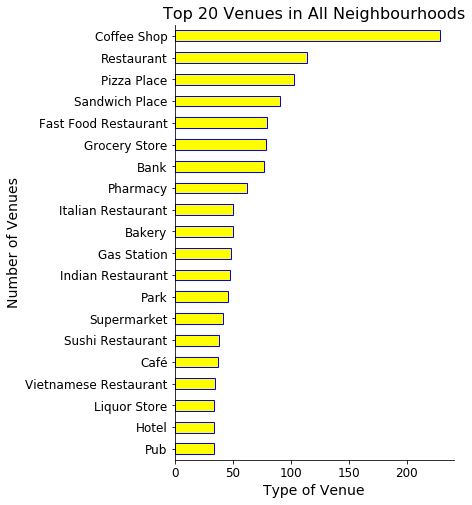

In [65]:
#there are so many venues, just take the top 20:
df1 = city_venues['Venue Category'].value_counts()
df1 = df1.head(20)

import matplotlib as mpl
import matplotlib.pyplot as plt

# figure size
fig = plt.figure(figsize=(5, 8))

ax = df1.plot(kind='barh', color=['yellow'],fontsize=12, ec='b')
ax.set_title('Top 20 Venues in All Neighbourhoods',fontsize = 16)
ax.set_ylabel('Number of Venues',fontsize = 14)
ax.set_xlabel('Type of Venue',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

#### Based on the initial exploratory analysis, Foursquare data frequency is highly influenced by restaurant data, not by daycare
Due to lower frequencies of check-ins at daycares and child cares, this will have to be intentionally searched for. The category ID's for various establishments are available from Foursquare: https://developer.foursquare.com/docs/build-with-foursquare/categories/

In [47]:
def getNearbyChoice(names, latitudes, longitudes, radius=2000):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,CHOICE)    
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([(name,lat,lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood','Neighborhood Latitude','Neighborhood Longitude', 
                  'Venue','Venue Latitude','Venue Longitude','Venue Category']
    return(nearby_venues)

In [48]:
# Get the nearby daycare and childcare centres for each neighbourhood
CHOICE = '5744ccdfe4b0c0459246b4c7'
city_daycare = getNearbyChoice(names=city_df['Neighbourhood'],latitudes=city_df['Latitude'],longitudes=city_df['Longitude'])

#### Add a red dot on the map for every daycare and child care centre listed in Foursquare

In [114]:
# new map
map_goldenhorseshoe_2 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add neighbourhood labels
for lat, lng, city, neighborhood in zip(city_df['Latitude'], city_df['Longitude'], city_df['City'], city_df['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=4,popup=label,color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_goldenhorseshoe_2)

# Add daycare centre labels
for lat, lng, venue, neighborhood in zip(city_daycare['Venue Latitude'], city_daycare['Venue Longitude'], city_daycare['Venue Category'], city_daycare['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='red',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_2)  
map_goldenhorseshoe_2

In [289]:
# What is the total number of daycare & child care establishments per neighbourhood?
city_daycare.to_csv('city_daycare_output.csv')

df_daycare = city_daycare['Neighborhood'].value_counts()
df_daycare = pd.DataFrame(df_daycare)

df_daycare.rename(columns={'Neighborhood':'Daycare','index':'Neighbourhood'}, inplace=True)
df_daycare.head()

,Daycare
Waterdown,7
West Hurontario,6
"North Erin Mills, Churchill Meadows, Streetsville, Vista Heights",5
Lakeview,5
"East Hurontario, West Rathwood",5


In [119]:
# Add the number of daycare centres to the master data frame of neighbourhoods
master_df = city_df.merge(df_daycare, on = 'Neighbourhood')
master_df.reset_index(inplace=True,drop=True)
master_df.head()

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School
0,Mississauga,"Applewood, Dixie",L4Y,43.602800,-79.592900,4,3
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.619200,-79.653800,5,6
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100,3,3
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600,5,8
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400,3,3
5,Mississauga,Lakeview,L5E,43.583600,-79.561000,5,3
6,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200,3,3
7,Mississauga,"Park Royal, Clarkson, Birchwood, Rattray Park ...",L5J,43.510200,-79.629600,4,6
8,Mississauga,"Sheridan Homelands, Sherwood Forest",L5K,43.527200,-79.661700,3,6
9,Mississauga,"Erin Mills, Business Park",L5L,43.537300,-79.690300,2,7


In [52]:
# How many neighbourhood were lost ?
print('Original number of neighbourhoods in list:', city_df.shape[0])
print('Number of neighbourhoods that have a daycare centre:', master_df.shape[0])
print('Number of neighbourhoods lacking daycare which were removed:', (city_df.shape[0])-(master_df.shape[0]))

Original number of neighbourhoods in list: 35
Number of neighbourhoods that have a daycare centre: 29
Number of neighbourhoods lacking daycare which were removed: 6


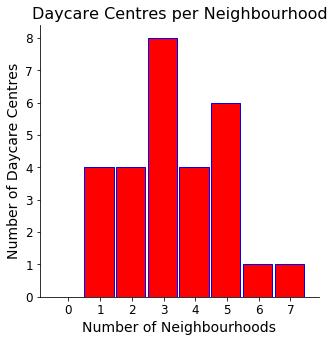

In [66]:
fig = plt.figure(figsize=(5, 5))
bin = np.arange(9) - 0.5

x0 = master_df[['Daycare']].copy()
ax = x0['Daycare'].plot(kind='hist', align='mid', width=0.92, color=['red'], bins=bin,fontsize=12,ec='b')
ax.set_title('Daycare Centres per Neighbourhood',fontsize = 16)
ax.set_ylabel('Number of Daycare Centres',fontsize = 14)
ax.set_xlabel('Number of Neighbourhoods',fontsize = 14)
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

29 of the original 35 neighbourhoods remain, as they have at least one local daycare centre.

### 3.5 Find neighbourhoods that have a local elementary school
Local determined by 1 km walking distance from neighbourhood centre. Foursquare code for elementary schools is '4f4533804b9074f6e4fb0105', and can be found here: https://developer.foursquare.com/docs/build-with-foursquare/categories/.

In [120]:
# Get the nearby daycare and childcare centres for each neighbourhood
CHOICE = '4f4533804b9074f6e4fb0105'
city_school = getNearbyChoice(names=master_df['Neighbourhood'],latitudes=master_df['Latitude'],longitudes=master_df['Longitude'])

In [290]:
# What is the total number of elementary schools per neighbourhood?
city_school.to_csv('city_school_output.csv')

df_school = city_school['Neighborhood'].value_counts()
df_school = pd.DataFrame(df_school)
df_school.reset_index(inplace=True)
df_school.rename(columns={'Neighborhood':'School','index':'Neighbourhood'}, inplace=True)
df_school

,Neighbourhood,School
0,"City Centre, Cooksville, Fairview, East Credit...",8
1,"Erin Mills, Business Park",7
2,"Sheridan Homelands, Sherwood Forest",6
3,"East Hurontario, West Rathwood",6
4,"Park Royal, Clarkson, Birchwood, Rattray Park ...",6
5,West Hurontario,5
6,"N: Wedgewood Creek, Winston Park, River Oaks, ...",5
7,"NW: West Mount, West Oak Trails, Glen Abbey",5
8,East Credit,4
9,"North Erin Mills, Churchill Meadows, Streetsvi...",4


In [123]:
# Add the number of daycare centres to the master data frame of neighbourhoods
master_df = master_df.merge(df_school, on = 'Neighbourhood')
master_df.reset_index(inplace=True,drop=True)
master_df

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School
0,Mississauga,"Applewood, Dixie",L4Y,43.602800,-79.592900,4,3
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.619200,-79.653800,5,6
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100,3,3
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600,5,8
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400,3,3
5,Mississauga,Lakeview,L5E,43.583600,-79.561000,5,3
6,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200,3,3
7,Mississauga,"Park Royal, Clarkson, Birchwood, Rattray Park ...",L5J,43.510200,-79.629600,4,6
8,Mississauga,"Sheridan Homelands, Sherwood Forest",L5K,43.527200,-79.661700,3,6
9,Mississauga,"Erin Mills, Business Park",L5L,43.537300,-79.690300,2,7


In [124]:
# How many neighbourhood were lost so far?
print('Original number of neighbourhoods in list:', city_df.shape[0])
print('Number of neighbourhoods that have daycare and school:', master_df.shape[0])
print('Number of neighbourhoods lacking daycare or school which were removed:', (city_df.shape[0])-(master_df.shape[0]))

Original number of neighbourhoods in list: 35
Number of neighbourhoods that have daycare and school: 28
Number of neighbourhoods lacking daycare or school which were removed: 7


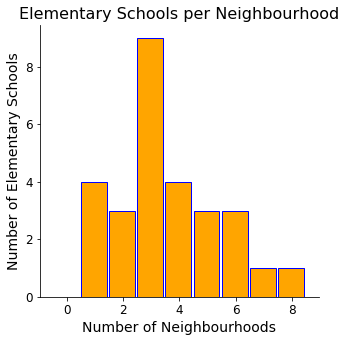

In [125]:
fig = plt.figure(figsize=(5, 5))
bin = np.arange(10) - 0.5

x0 = master_df[['School']].copy()
ax = x0['School'].plot(kind='hist', align='mid', width=0.92, color=['orange'], bins=bin,fontsize=12,ec='b')
ax.set_title('Elementary Schools per Neighbourhood',fontsize = 16)
ax.set_ylabel('Number of Elementary Schools',fontsize = 14)
ax.set_xlabel('Number of Neighbourhoods',fontsize = 14)
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [127]:
# Map the neighbourhoods with a school, that already have been filtered through having a daycare facility
# new map
map_goldenhorseshoe_3 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add neighbourhood markers:
for lat, lng, city, neighborhood in zip(master_df['Latitude'], master_df['Longitude'], master_df['City'], master_df['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=4,popup=label,color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_goldenhorseshoe_3)
    
# Add elementary school markers:   
for lat, lng, venue, neighborhood in zip(city_school['Venue Latitude'], city_school['Venue Longitude'], city_school['Venue Category'], city_school['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='orange',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_3)  
    
map_goldenhorseshoe_3

#### 28 Neighbourhoods have at least one local daycare centre and elementary school
### 3.6 Find neighbourhoods with a high diversity of outdoor and athletic facilities
Now, time to research the diversity of the outdoor facilities and athletic facilities available per neighbourhood. The outdoor facilities of interest to the couple are (coupled to their Foursquare category ID): 
   * Playground			   
   * Bike Trail			   
   * Beach			    	
   * Botanical Garden		
   * Dog Run				 
   * Fishing Spot			
   * Lake			    	 
   * Nature Preserve		  
   * Other Great Outdoors	 
   * Park					 
   * Pool	
   
Furthermore, the couples are interested in athletic facilities such as:
   
   * Gym / Fitness Center	 
   * Boxing Gym			  
   * Climbing Gym			
   * Cycle Studio			 
   * Gym Pool				
   * Gymnastics Gym		
   * Gym					  
   * Martial Arts Dojo	    
   * Outdoor Gym			
   * Pilates Studio		   
   * Track				    
   * Yoga Studio			 
   * Indoor Play Area		
   * Recreation Center	  
    
#### Use 'Outdoors & Recreation' category ID from Foursquare

In [87]:
# Outdoors & Recreation
CHOICE = '4d4b7105d754a06377d81259'
city_outdoors = getNearbyChoice(names=master_df['Neighbourhood'],latitudes=master_df['Latitude'],longitudes=master_df['Longitude'])

In [88]:
city_outdoors.to_csv('city_outdoors_output.csv', index=False)
city_outdoors.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Applewood, Dixie",43.6028,-79.5929,Dixie Curling Club,43.605886,-79.591427,Curling Ice
1,"Applewood, Dixie",43.6028,-79.5929,Up The Bloc,43.603683,-79.584380,Climbing Gym
2,"Applewood, Dixie",43.6028,-79.5929,LA Fitness,43.609377,-79.587270,Gym / Fitness Center
3,"Applewood, Dixie",43.6028,-79.5929,F45 Training Dixie,43.608640,-79.584279,Gym
4,"Applewood, Dixie",43.6028,-79.5929,Physiomed Fitness,43.610196,-79.586744,Gym / Fitness Center
5,"Applewood, Dixie",43.6028,-79.5929,Wynn Fitness Mississauga,43.613754,-79.577678,Gym
6,"Applewood, Dixie",43.6028,-79.5929,Bloor Athletic Field,43.605741,-79.605066,Soccer Field
7,"Applewood, Dixie",43.6028,-79.5929,All Canadian Martial Arts Academy,43.606854,-79.580298,Martial Arts Dojo
8,"Applewood, Dixie",43.6028,-79.5929,Queensway Trail,43.588504,-79.589164,Trail
9,"Applewood, Dixie",43.6028,-79.5929,Wynn Fitness Clubs,43.614152,-79.578427,Gym / Fitness Center


#### How many total unique venus categories were found in the Recreation & Outdoors search?

In [89]:
print('There are {} unique recreation categories.'.format(len(city_outdoors['Venue Category'].unique())))

There are 38 unique recreation categories.


#### How many recreational venues were found per neighbourhood?

In [90]:
df_outdoors = city_outdoors['Neighborhood'].value_counts()
df_outdoors = pd.DataFrame(df_outdoors)
df_outdoors.reset_index(inplace=True)
df_outdoors.rename(columns={'Neighborhood':'Recreation','index':'Neighbourhood'}, inplace=True)
df_outdoors.head()

,Neighbourhood,Recreation
0,Central Oakville,32
1,"SW Lakeview, Mineola, East Port Credit",32
2,"N: Alton Village, Headon Forest, Palmer, Millc...",27
3,"City Centre, Cooksville, Fairview, East Credit...",23
4,"S: Central, Plains, Maple",22


In [148]:
# Add the number of recreation centres to the master data frame of neighbourhoods
master_df = master_df.merge(df_outdoors, on = 'Neighbourhood')
master_df.reset_index(inplace=True,drop=True)
master_df.head()

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation
0,Mississauga,"Applewood, Dixie",L4Y,43.6028,-79.5929,4,3,17
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.6192,-79.6538,5,6,15
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.5883,-79.6091,3,3,18
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.5771,-79.6306,5,8,23
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.5624,-79.6504,3,3,20


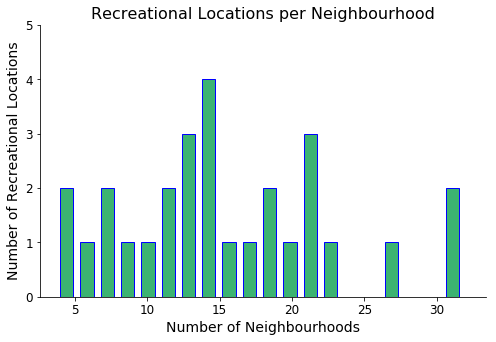

In [94]:
x0 = master_df[['Recreation']].copy()
ax = x0['Recreation'].plot(kind='hist', align='mid', width=0.92, color=['mediumseagreen'],bins=20,fontsize=12,ec='b',figsize=(8, 5))
ax.set_title('Recreational Locations per Neighbourhood',fontsize = 16)
ax.set_ylabel('Number of Recreational Locations',fontsize = 14)
ax.set_xlabel('Number of Neighbourhoods',fontsize = 14)
ax.set_ylim([0,5])
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

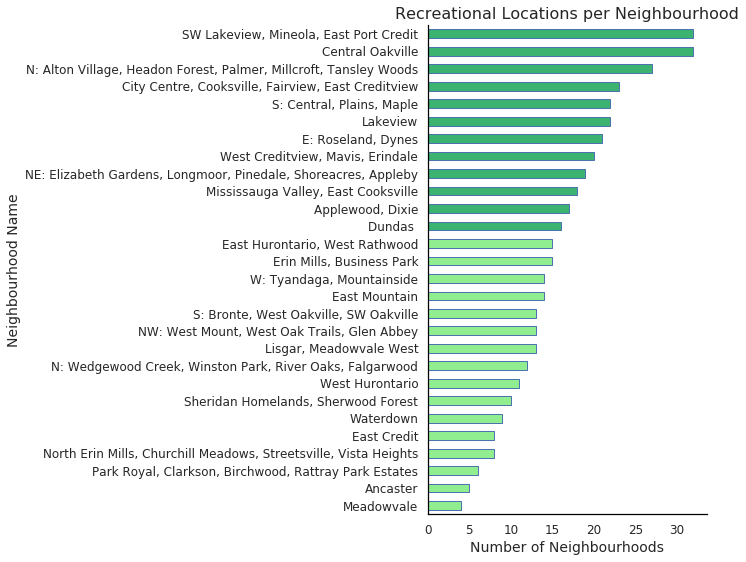

In [259]:
a1 = master_df[['Neighbourhood','Recreation']].copy()
a1.set_index('Neighbourhood', inplace = True)
a1.sort_values('Recreation', ascending = False, inplace = True)
list = ['mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen',
        'mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen','mediumseagreen',
        'lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen',
        'lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen','lightgreen']
ax = a1['Recreation'].plot(kind='barh', color=list,ec='b',figsize=(5, 9),fontsize = 12)
ax.set_title('Recreational Locations per Neighbourhood',fontsize = 16)
ax.set_ylabel('Neighbourhood Name',fontsize = 14)
ax.set_xlabel('Number of Neighbourhoods',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [100]:
#Determine the most frequent types of recreation venues
df = city_outdoors['Venue Category'].value_counts()
df = pd.DataFrame(df)
df.head(10)

,Venue Category
Park,114
Gym,63
Gym / Fitness Center,62
Skating Rink,21
Soccer Field,17
Yoga Studio,17
Trail,16
Baseball Field,16
Athletics & Sports,15
Golf Course,13


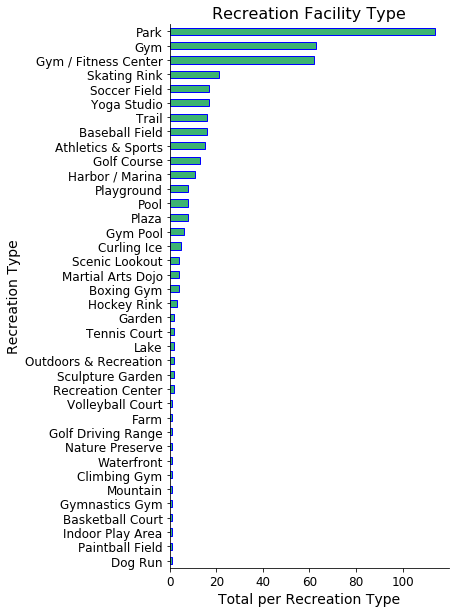

In [101]:
ax = df['Venue Category'].plot(kind='barh', color='mediumseagreen',figsize=(5, 10),ec='b',fontsize = 12)
ax.set_title('Recreation Facility Type',fontsize = 16)
ax.set_ylabel('Recreation Type',fontsize = 14)
ax.set_xlabel('Total per Recreation Type',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [108]:
# View recreaton locations on map
# new map
map_goldenhorseshoe_4 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add neighbourhood labels
for lat, lng, city, neighborhood in zip(master_df['Latitude'], master_df['Longitude'], master_df['City'], master_df['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=4,popup=label,color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_goldenhorseshoe_4)

# Add recreation facility markers:  
for lat, lng, venue, neighborhood in zip(city_outdoors['Venue Latitude'], city_outdoors['Venue Longitude'], city_outdoors['Venue Category'], city_outdoors['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='mediumseagreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_4)  
map_goldenhorseshoe_4

In [131]:
# one hot encoding: turn the venue categories into numerical values
city_onehot = pd.get_dummies(city_outdoors[['Venue Category']], prefix="", prefix_sep="")

# add 'neighbourhood' column to dataframe
city_onehot['New'] = city_outdoors['Neighborhood'] 
city_onehot.insert(0, 'Neighbourhood', city_onehot['New'], True)
city_onehot.drop(['New'], axis=1, inplace=True)

# determine relative frequency of each venue category per neighbourhood
city_onehot = city_onehot.groupby('Neighbourhood').mean().reset_index()

city_onehot.head()

,Neighbourhood,Athletics & Sports,Baseball Field,Basketball Court,Boxing Gym,Climbing Gym,Curling Ice,Dog Run,Farm,Garden,...,Recreation Center,Scenic Lookout,Sculpture Garden,Skating Rink,Soccer Field,Tennis Court,Trail,Volleyball Court,Waterfront,Yoga Studio
0,Ancaster,0.000000,0.2000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0000,0.000000,0.200000,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,"Applewood, Dixie",0.000000,0.0000,0.0,0.000000,0.058824,0.058824,0.0,0.0,0.0,...,0.0,0.0000,0.000000,0.000000,0.058824,0.0,0.058824,0.0,0.0,0.117647
2,Central Oakville,0.062500,0.0000,0.0,0.000000,0.000000,0.031250,0.0,0.0,0.0,...,0.0,0.0000,0.000000,0.031250,0.000000,0.0,0.000000,0.0,0.0,0.156250
3,"City Centre, Cooksville, Fairview, East Credit...",0.043478,0.0000,0.0,0.043478,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0000,0.043478,0.086957,0.043478,0.0,0.043478,0.0,0.0,0.043478
4,Dundas,0.000000,0.0625,0.0,0.000000,0.000000,0.062500,0.0,0.0,0.0,...,0.0,0.0625,0.000000,0.062500,0.062500,0.0,0.125000,0.0,0.0,0.125000


### 3.7 Prescriptive Analytics
#### Use principal component analysis to determine neighbourhoods that offer similar recreation facilities

In [132]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA

In [133]:
rec_X = city_onehot.iloc[:,1:].values  
rec_X[0]

array([0. , 0.2, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.2, 0. , 0. , 0.2,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.2, 0. ,
       0. , 0. , 0. , 0. , 0. , 0.2, 0. , 0. , 0. , 0. , 0. , 0. ])

In [134]:
rec_Y = city_onehot['Neighbourhood'].values
rec_Y[0:5]

array(['Ancaster', 'Applewood, Dixie', 'Central Oakville',
       'City Centre, Cooksville, Fairview, East Creditview', 'Dundas '],
      dtype=object)

In [135]:
pca = PCA(n_components=2)
pca.fit(rec_X)

rec_X_pca = pca.transform(rec_X)
print("original shape:   ", rec_X.shape)
print("transformed shape:", rec_X_pca.shape)
print("explained variance: PC#1 is", pca.explained_variance_ratio_[0]*100, "%, and PC#2 is", pca.explained_variance_ratio_[1]*100, "%")

original shape:    (28, 38)
transformed shape: (28, 2)
explained variance: PC#1 is 31.02094178595208 %, and PC#2 is 16.80151303741321 %


In [136]:
# Create dataframe for PCA cordinates
PCA_df = pd.DataFrame(rec_X_pca)
PCA_df['New'] = city_onehot['Neighbourhood'] 
PCA_df.insert(0, 'Neighbourhood', PCA_df['New'], True)
PCA_df.drop(['New'], axis=1, inplace=True)
PCA_df.rename(columns={0:'PC#1'}, inplace=True)
PCA_df.rename(columns={1:'PC#2'}, inplace=True)
PCA_df.head()

,Neighbourhood,PC#1,PC#2
0,Ancaster,0.100606,0.171887
1,"Applewood, Dixie",0.016479,-0.002556
2,Central Oakville,0.084771,-0.037081
3,"City Centre, Cooksville, Fairview, East Credit...",0.055654,0.073381
4,Dundas,0.066575,0.050090


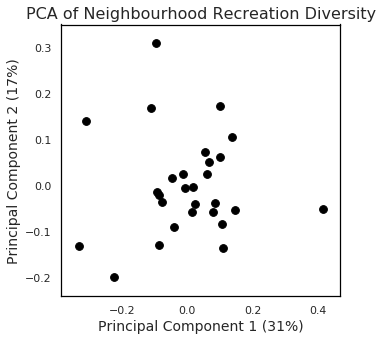

In [137]:
ax = PCA_df.plot(kind='scatter', x='PC#1', y='PC#2', color='black',figsize=(5,5),s=60)
ax.set_title('PCA of Neighbourhood Recreation Diversity',fontsize = 16)
ax.set_ylabel('Principal Component 2 (17%)',fontsize = 14)
ax.set_xlabel('Principal Component 1 (31%)',fontsize = 14)
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_color('black')
ax.spines['top'].set_color('black')

In [138]:
# Cluster the neighbourhoods using k-means, and 4 distinct clusters based on the PCA above
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors

k_means = KMeans(init = "k-means++", n_clusters = 4, n_init = 12)
k_means.fit(rec_X_pca)
k_means_labels = k_means.labels_
print("The k means labels are:", k_means_labels)
k_means_cluster_centers = k_means.cluster_centers_

The k means labels are: [0 0 0 0 0 0 2 0 0 1 0 0 3 0 1 0 0 1 1 2 0 0 1 1 0 2 0 1]


In [139]:
#Add a new column for the KMeans Cluster
km = pd.DataFrame(k_means_labels)
PCA_df['New'] = km 
PCA_df.insert(1, 'KMeans Cluster', PCA_df['New'], True)
PCA_df.drop(['New'], axis=1, inplace=True)
PCA_df.head()

,Neighbourhood,KMeans Cluster,PC#1,PC#2
0,Ancaster,0,0.100606,0.171887
1,"Applewood, Dixie",0,0.016479,-0.002556
2,Central Oakville,0,0.084771,-0.037081
3,"City Centre, Cooksville, Fairview, East Credit...",0,0.055654,0.073381
4,Dundas,0,0.066575,0.050090


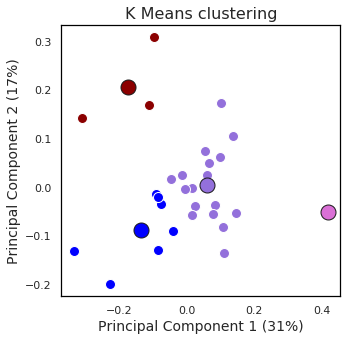

In [140]:
# Initialize the plot with the specified dimensions
fig = plt.figure(figsize=(5, 5))
x = np.arange(4)
color_list = ['mediumpurple','blue','darkred','orchid']

# Create a plot
ax = fig.add_subplot(1, 1, 1)
for k, col in zip(range(len([[4,4], [-2, -1], [2, -3], [1, 1]])), color_list):
    my_members = (k_means_labels == k)
    # Define the centroid, or cluster center.
    cluster_center = k_means_cluster_centers[k]
    # Plots the datapoints with color col.
    ax.plot(rec_X_pca[my_members, 0], rec_X_pca[my_members, 1], 'w', markerfacecolor=col, marker='o',markersize=10)
    # Plots the centroids with specified color, but with a darker outline
    ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,  markeredgecolor='k', markersize=15)

ax.set_title('K Means clustering',fontsize = 16)
ax.set_ylabel('Principal Component 2 (17%)',fontsize = 14)
ax.set_xlabel('Principal Component 1 (31%)',fontsize = 14)
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_color('black')
ax.spines['top'].set_color('black')

In [149]:
#Add the KMeans cluster to the master spread sheet
master_df = master_df.merge(PCA_df, on = 'Neighbourhood')
master_df

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,PC#2
0,Mississauga,"Applewood, Dixie",L4Y,43.602800,-79.592900,4,3,17,0,0.016479,-0.002556
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.619200,-79.653800,5,6,15,0,0.136981,0.104829
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100,3,3,18,0,-0.045249,0.015593
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600,5,8,23,0,0.055654,0.073381
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400,3,3,20,0,0.099627,0.061834
5,Mississauga,Lakeview,L5E,43.583600,-79.561000,5,3,22,0,0.077767,-0.056499
6,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200,3,3,32,1,-0.039513,-0.091104
7,Mississauga,"Park Royal, Clarkson, Birchwood, Rattray Park ...",L5J,43.510200,-79.629600,4,6,6,2,-0.310871,0.141222
8,Mississauga,"Sheridan Homelands, Sherwood Forest",L5K,43.527200,-79.661700,3,6,10,1,-0.084874,-0.129760
9,Mississauga,"Erin Mills, Business Park",L5L,43.537300,-79.690300,2,7,15,1,-0.076264,-0.035336


#### Visualize the 4 neighbourhood types on the map to see if they associate by location

In [154]:
# new map
map_goldenhorseshoe_5 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add recreation facility markers:  
for lat, lng, venue, neighborhood in zip(city_outdoors['Venue Latitude'], city_outdoors['Venue Longitude'], city_outdoors['Venue Category'], city_outdoors['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='mediumseagreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_5)  

# set color scheme for the clusters, have to a different order than K Means algorithmn, in order to stay consistent with colouring between plots
#KMeans color_list = ['mediumpurple','blue','darkred','orchid']
rainbow = ['blue','darkred','orchid','mediumpurple']

# add markers to the map, for KMeans Clustered neighbourhoods
markers_colors = []
for lat, lon, poi, cluster in zip(master_df['Latitude'], master_df['Longitude'], master_df['Neighbourhood'], master_df['KMeans Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(map_goldenhorseshoe_5)
    
map_goldenhorseshoe_5

#### Legend
cluster 0 = purple  
cluster 1 = blue  
cluster 2 = maroon  
cluster 3 = pink

In [157]:
master_df.head()

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,PC#2
0,Mississauga,"Applewood, Dixie",L4Y,43.6028,-79.5929,4,3,17,0,0.016479,-0.002556
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.6192,-79.6538,5,6,15,0,0.136981,0.104829
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.5883,-79.6091,3,3,18,0,-0.045249,0.015593
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.5771,-79.6306,5,8,23,0,0.055654,0.073381
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.5624,-79.6504,3,3,20,0,0.099627,0.061834


#### Key features of the 4 clusters of Neighbourhoods based on Recreation Facilities
Let's investigate the leading characteristics of the 4 different clusters, as well as the leading neighbourhoods in each cluster in terms of recreational facility quantity. 
#### Let's prepare the data, then subset by cluster

In [171]:
city_onehot.shape

(28, 39)

In [174]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)    
    return row_categories_sorted.index.values[0:num_top_venues]

In [178]:
num_top_venues = 10
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
rec_sorted = pd.DataFrame(columns=columns)
rec_sorted['Neighbourhood'] = city_onehot['Neighbourhood']

for ind in np.arange(city_onehot.shape[0]):
    rec_sorted.iloc[ind, 1:] = return_most_common_venues(city_onehot.iloc[ind, :], num_top_venues)

In [179]:
rec_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Ancaster,Golf Course,Baseball Field,Skating Rink,Gym / Fitness Center,Park,Yoga Studio,Harbor / Marina,Gymnastics Gym,Gym Pool,Gym
1,"Applewood, Dixie",Park,Gym / Fitness Center,Gym,Yoga Studio,Trail,Martial Arts Dojo,Soccer Field,Climbing Gym,Curling Ice,Gymnastics Gym
2,Central Oakville,Park,Gym,Yoga Studio,Gym / Fitness Center,Harbor / Marina,Athletics & Sports,Skating Rink,Playground,Curling Ice,Golf Course
3,"City Centre, Cooksville, Fairview, East Credit...",Gym / Fitness Center,Park,Plaza,Gym,Skating Rink,Yoga Studio,Pool,Boxing Gym,Athletics & Sports,Sculpture Garden
4,Dundas,Park,Yoga Studio,Gym / Fitness Center,Trail,Scenic Lookout,Gym,Curling Ice,Plaza,Skating Rink,Soccer Field


In [188]:
#Add the top recreation venues to the master spread sheet
master_df = master_df.merge(rec_sorted, on = 'Neighbourhood')
master_df.to_csv('master_df_output.csv', index=False)
master_df.head()

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Mississauga,"Applewood, Dixie",L4Y,43.6028,-79.5929,4,3,17,0,0.016479,...,Park,Gym / Fitness Center,Gym,Yoga Studio,Trail,Martial Arts Dojo,Soccer Field,Climbing Gym,Curling Ice,Gymnastics Gym
1,Mississauga,"East Hurontario, West Rathwood",L4Z,43.6192,-79.6538,5,6,15,0,0.136981,...,Gym / Fitness Center,Golf Course,Soccer Field,Gym,Park,Athletics & Sports,Baseball Field,Boxing Gym,Skating Rink,Gymnastics Gym
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.5883,-79.6091,3,3,18,0,-0.045249,...,Park,Trail,Plaza,Gym / Fitness Center,Pool,Gym,Athletics & Sports,Skating Rink,Soccer Field,Tennis Court
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.5771,-79.6306,5,8,23,0,0.055654,...,Gym / Fitness Center,Park,Plaza,Gym,Skating Rink,Yoga Studio,Pool,Boxing Gym,Athletics & Sports,Sculpture Garden
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.5624,-79.6504,3,3,20,0,0.099627,...,Park,Trail,Gym / Fitness Center,Yoga Studio,Gym,Baseball Field,Boxing Gym,Golf Course,Athletics & Sports,Soccer Field


### Cluster 0

In [189]:
#subset cluster 0
options = ['0']
cluster0 = master_df[master_df['KMeans Cluster'].isin(options)]
cluster0.sort_values('Recreation',ascending=False)

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
16,Oakville,Central Oakville,L6K,43.439600,-79.687800,2,1,32,0,0.084771,...,Park,Gym,Yoga Studio,Gym / Fitness Center,Harbor / Marina,Athletics & Sports,Skating Rink,Playground,Curling Ice,Golf Course
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600,5,8,23,0,0.055654,...,Gym / Fitness Center,Park,Plaza,Gym,Skating Rink,Yoga Studio,Pool,Boxing Gym,Athletics & Sports,Sculpture Garden
5,Mississauga,Lakeview,L5E,43.583600,-79.561000,5,3,22,0,0.077767,...,Park,Gym,Yoga Studio,Skating Rink,Golf Course,Pool,Dog Run,Farm,Trail,Baseball Field
23,Burlington,"S: Central, Plains, Maple","L7R, L7S",43.332300,-79.807732,3,1,22,0,0.015443,...,Park,Gym,Baseball Field,Gym / Fitness Center,Athletics & Sports,Recreation Center,Garden,Playground,Harbor / Marina,Hockey Rink
21,Burlington,"E: Roseland, Dynes",L7N,43.349176,-79.782273,4,1,21,0,0.145417,...,Gym,Park,Yoga Studio,Soccer Field,Playground,Baseball Field,Curling Ice,Garden,Gym / Fitness Center,Hockey Rink
4,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400,3,3,20,0,0.099627,...,Park,Trail,Gym / Fitness Center,Yoga Studio,Gym,Baseball Field,Boxing Gym,Golf Course,Athletics & Sports,Soccer Field
19,Burlington,"NE: Elizabeth Gardens, Longmoor, Pinedale, Sho...",L7L,43.369117,-79.756033,1,2,19,0,0.059768,...,Park,Gym / Fitness Center,Baseball Field,Gym,Skating Rink,Yoga Studio,Playground,Gym Pool,Outdoors & Recreation,Athletics & Sports
2,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100,3,3,18,0,-0.045249,...,Park,Trail,Plaza,Gym / Fitness Center,Pool,Gym,Athletics & Sports,Skating Rink,Soccer Field,Tennis Court
0,Mississauga,"Applewood, Dixie",L4Y,43.602800,-79.592900,4,3,17,0,0.016479,...,Park,Gym / Fitness Center,Gym,Yoga Studio,Trail,Martial Arts Dojo,Soccer Field,Climbing Gym,Curling Ice,Gymnastics Gym
25,West Hamilton,Dundas,L9H,43.263800,-79.952400,1,4,16,0,0.066575,...,Park,Yoga Studio,Gym / Fitness Center,Trail,Scenic Lookout,Gym,Curling Ice,Plaza,Skating Rink,Soccer Field


In [242]:
#What is the average number of venues in this cluster?
print('The average number of facilities in this cluster are:')
print('Daycare:', round(cluster0['Daycare'].mean(axis=0),0))
print('Schools:', round(cluster0['School'].mean(axis=0),0))
print('Recreation:', round(cluster0['Recreation'].mean(axis=0),0))

The average number of facilities in this cluster are:
Daycare: 3.0
Schools: 3.0
Recreation: 17.0


#### Cluster 0, park and gyms are equally represented as the most common recreational venue, and there is a high degree of heterogeneity in the less frequent venues. Overall, this cluster has the highest quantity of recreational venues.

### Cluster 1

In [185]:
#subset cluster 1
options = ['1']
cluster1 = master_df[master_df['KMeans Cluster'].isin(options)]
cluster1.sort_values('Recreation',ascending=False)

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200,3,3,32,1,-0.039513,...,Park,Harbor / Marina,Gym,Skating Rink,Gym / Fitness Center,Pool,Trail,Waterfront,Martial Arts Dojo,Yoga Studio
20,Burlington,"N: Alton Village, Headon Forest, Palmer, Millc...",L7M,43.382747,-79.808231,2,3,27,1,-0.092110,...,Park,Gym / Fitness Center,Gym,Baseball Field,Athletics & Sports,Martial Arts Dojo,Soccer Field,Gym Pool,Paintball Field,Golf Course
9,Mississauga,"Erin Mills, Business Park",L5L,43.537300,-79.690300,2,7,15,1,-0.076264,...,Park,Gym / Fitness Center,Gym,Pool,Playground,Basketball Court,Skating Rink,Gymnastics Gym,Gym Pool,Golf Driving Range
18,Oakville,"NW: West Mount, West Oak Trails, Glen Abbey",L6M,43.445136,-79.744617,1,5,13,1,-0.225695,...,Park,Trail,Gym,Skating Rink,Yoga Studio,Garden,Gymnastics Gym,Gym Pool,Gym / Fitness Center,Golf Driving Range
12,Mississauga,West Hurontario,L5R,43.606000,-79.670800,6,5,11,1,-0.085432,...,Park,Gym / Fitness Center,Gym,Athletics & Sports,Golf Course,Boxing Gym,Harbor / Marina,Gymnastics Gym,Gym Pool,Golf Driving Range
8,Mississauga,"Sheridan Homelands, Sherwood Forest",L5K,43.527200,-79.661700,3,6,10,1,-0.084874,...,Park,Gym,Athletics & Sports,Baseball Field,Gym / Fitness Center,Playground,Golf Driving Range,Harbor / Marina,Gymnastics Gym,Gym Pool
10,Mississauga,"North Erin Mills, Churchill Meadows, Streetsvi...",L5M,43.563700,-79.720200,5,4,8,1,-0.333135,...,Park,Gym Pool,Gym / Fitness Center,Gym,Yoga Studio,Golf Course,Harbor / Marina,Gymnastics Gym,Golf Driving Range,Garden


In [241]:
#What is the average number of venues in this cluster?
print('The average number of facilities in this cluster are:')
print('Daycare:', round(cluster1['Daycare'].mean(axis=0),0))
print('Schools:', round(cluster1['School'].mean(axis=0),0))
print('Recreation:', round(cluster1['Recreation'].mean(axis=0),0))

The average number of facilities in this cluster are:
Daycare: 3.0
Schools: 5.0
Recreation: 17.0


### Cluster 1 summary
Cluster 1 has a high emphasis on parks, then gyms, and heterogeneous collection of individual sport venues such as: baseball, playground, boxing, martial arts, and lastly, golf. Trails, waterfront, and harbour access are also commonly emphasized. The average number of daycare centres is 3, and the average number of elementary schools is 5 per neighbourhood, which is the highest of all the clusters.

### Cluster 2

In [186]:
#subset cluster 2
options = ['2']
cluster2 = master_df[master_df['KMeans Cluster'].isin(options)]
cluster2.sort_values('Recreation',ascending=False)

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,West Hamilton,Waterdown,L0R,43.325531,-79.901658,7,3,9,2,-0.096208,...,Gym / Fitness Center,Park,Trail,Golf Driving Range,Scenic Lookout,Yoga Studio,Garden,Gymnastics Gym,Gym Pool,Gym
13,Mississauga,East Credit,L5V,43.597200,-79.693100,3,4,8,2,-0.110022,...,Park,Golf Course,Gym / Fitness Center,Soccer Field,Yoga Studio,Harbor / Marina,Gymnastics Gym,Gym Pool,Gym,Golf Driving Range
7,Mississauga,"Park Royal, Clarkson, Birchwood, Rattray Park ...",L5J,43.510200,-79.629600,4,6,6,2,-0.310871,...,Park,Gym / Fitness Center,Tennis Court,Yoga Studio,Golf Course,Harbor / Marina,Gymnastics Gym,Gym Pool,Gym,Golf Driving Range


In [239]:
#What is the average number of venues in this cluster?
print('The average number of facilities in this cluster are:')
print('Daycare:', round(cluster2['Daycare'].mean(axis=0),0))
print('Schools:', round(cluster2['School'].mean(axis=0),0))
print('Recreation:', round(cluster2['Recreation'].mean(axis=0),0))

The average number of facilities in this cluster are:
Daycare: 5.0
Schools: 4.0
Recreation: 8.0


#### Cluster 2 has less emphasis on parks, and a greater emphasis on gyms, golfing, yoga studios. Overall, has less than half the total venues available compared to cluster 0 and 1. However, there are more daycare centres available per neighbourhood than all other clusters.

### Cluster 3 (only 1 neighbourhood)

In [187]:
#subset cluster 3
options = ['3']
cluster3 = master_df[master_df['KMeans Cluster'].isin(options)]
cluster3.sort_values('Recreation',ascending=False)

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Mississauga,Meadowvale,L5W,43.6313,-79.7148,5,2,4,3,0.416854,...,Golf Course,Baseball Field,Nature Preserve,Gym,Yoga Studio,Harbor / Marina,Gymnastics Gym,Gym Pool,Gym / Fitness Center,Golf Driving Range


In [240]:
#What is the average number of venues in this cluster?
print('The number of facilities in this cluster are:')
print('Daycare: 5')
print('Schools: 2')
print('Recreation: 4')

The number of facilities in this cluster are:
Daycare: 5
Schools: 2
Recreation: 4


#### Cluster 3 neighbourhood prioritizes golf, gym, gymnastics. Has a low total number of recreational venues.

### Narrowing down choices from Clusters 0 and 1
Since there are still many suitable neighbourhoods, which meet the couple's list of requirements. The couples have decided they would also prefer a negihbourhood wih a local martial arts dojo. Therefore, they wish to narrow down the neighbourhoods featured in Cluster 0 and 1, which are have a martial arts dojo, on top of the daycare, and school, and highly diverse recreational facilities available.

Subset the neighbourhoods from clusters 0 and 1, ranked in decsending order by number of recreational facilities. Currently, 24 neighbourhoods remain. Remove the the neighbourhoods from the dateframe that have 15 or less recreational facilties available (the bottom half). 

#### Now, 12 neighbourhoods remain

In [253]:
options = ['0','1']
master_narrow = master_df[master_df['KMeans Cluster'].isin(options)]
master_narrow = master_narrow.sort_values('Recreation',ascending=False)
master_narrow.reset_index(inplace=True,drop=True)
master_narrow.drop([12,13,14,15,16,17,18,19,20,21,21,22,23], axis=0, inplace=True)
master_narrow

,City,Neighbourhood,Postal_code,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Mississauga,"SW Lakeview, Mineola, East Port Credit",L5G,43.564700,-79.585200,3,3,32,1,-0.039513,...,Park,Harbor / Marina,Gym,Skating Rink,Gym / Fitness Center,Pool,Trail,Waterfront,Martial Arts Dojo,Yoga Studio
1,Oakville,Central Oakville,L6K,43.439600,-79.687800,2,1,32,0,0.084771,...,Park,Gym,Yoga Studio,Gym / Fitness Center,Harbor / Marina,Athletics & Sports,Skating Rink,Playground,Curling Ice,Golf Course
2,Burlington,"N: Alton Village, Headon Forest, Palmer, Millc...",L7M,43.382747,-79.808231,2,3,27,1,-0.092110,...,Park,Gym / Fitness Center,Gym,Baseball Field,Athletics & Sports,Martial Arts Dojo,Soccer Field,Gym Pool,Paintball Field,Golf Course
3,Mississauga,"City Centre, Cooksville, Fairview, East Credit...",L5B,43.577100,-79.630600,5,8,23,0,0.055654,...,Gym / Fitness Center,Park,Plaza,Gym,Skating Rink,Yoga Studio,Pool,Boxing Gym,Athletics & Sports,Sculpture Garden
4,Burlington,"S: Central, Plains, Maple","L7R, L7S",43.332300,-79.807732,3,1,22,0,0.015443,...,Park,Gym,Baseball Field,Gym / Fitness Center,Athletics & Sports,Recreation Center,Garden,Playground,Harbor / Marina,Hockey Rink
5,Mississauga,Lakeview,L5E,43.583600,-79.561000,5,3,22,0,0.077767,...,Park,Gym,Yoga Studio,Skating Rink,Golf Course,Pool,Dog Run,Farm,Trail,Baseball Field
6,Burlington,"E: Roseland, Dynes",L7N,43.349176,-79.782273,4,1,21,0,0.145417,...,Gym,Park,Yoga Studio,Soccer Field,Playground,Baseball Field,Curling Ice,Garden,Gym / Fitness Center,Hockey Rink
7,Mississauga,"West Creditview, Mavis, Erindale",L5C,43.562400,-79.650400,3,3,20,0,0.099627,...,Park,Trail,Gym / Fitness Center,Yoga Studio,Gym,Baseball Field,Boxing Gym,Golf Course,Athletics & Sports,Soccer Field
8,Burlington,"NE: Elizabeth Gardens, Longmoor, Pinedale, Sho...",L7L,43.369117,-79.756033,1,2,19,0,0.059768,...,Park,Gym / Fitness Center,Baseball Field,Gym,Skating Rink,Yoga Studio,Playground,Gym Pool,Outdoors & Recreation,Athletics & Sports
9,Mississauga,"Mississauga Valley, East Cooksville",L5A,43.588300,-79.609100,3,3,18,0,-0.045249,...,Park,Trail,Plaza,Gym / Fitness Center,Pool,Gym,Athletics & Sports,Skating Rink,Soccer Field,Tennis Court


In [273]:
# Find the martial arts dojos
# Extend the driving radius to 3 km, which is approximately 10 minutes of biking

def getDojos(names, latitudes, longitudes, radius=3000):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,CHOICE)    
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([(name,lat,lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood','Neighborhood Latitude','Neighborhood Longitude', 
                  'Venue','Venue Latitude','Venue Longitude','Venue Category']
    return(nearby_venues)

CHOICE = '4bf58dd8d48988d101941735'
Dojo_df = getDojos(names=master_narrow['Neighbourhood'],latitudes=master_narrow['Latitude'],longitudes=master_narrow['Longitude'])

In [274]:
print('There are', Dojo_df.shape[0], 'Martial Arts Dojos in the top 12 neighbourhoods')
Dojo_df.head()

There are 43 Martial Arts Dojos in the top 12 neighbourhoods


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"SW Lakeview, Mineola, East Port Credit",43.5647,-79.5852,World Class Karate,43.561350,-79.575272,Martial Arts Dojo
1,"SW Lakeview, Mineola, East Port Credit",43.5647,-79.5852,CMAC Port Credit - Akai Take Budo Dojo,43.557647,-79.578571,Martial Arts Dojo
2,"SW Lakeview, Mineola, East Port Credit",43.5647,-79.5852,Academy Of Martial Arts (Port Credit),43.553638,-79.583557,Martial Arts Dojo
3,"SW Lakeview, Mineola, East Port Credit",43.5647,-79.5852,SKIF Mississauga,43.573421,-79.604984,Martial Arts Dojo
4,Central Oakville,43.4396,-79.6878,Black Belt World,43.437402,-79.698343,Martial Arts Dojo


In [292]:
# new map for to 12 neighbourhoods and the available martial arts dojos
map_goldenhorseshoe_6 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add Martial Arts Dojo markers:  
for lat, lng, venue, neighborhood in zip(Dojo_df['Venue Latitude'], Dojo_df['Venue Longitude'], Dojo_df['Venue Category'], Dojo_df['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='limegreen',
        fill=True,fill_opacity=1,parse_html=False).add_to(map_goldenhorseshoe_6)  

# add markers to the map, for KMeans Clustered neighbourhoods
rainbow = ['blue','mediumpurple']
markers_colors = []
for lat, lon, poi, cluster in zip(master_narrow['Latitude'], master_narrow['Longitude'], master_narrow['Neighbourhood'], master_narrow['KMeans Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],radius=5,popup=label,color=rainbow[cluster-1],fill=True,fill_color=rainbow[cluster-1],fill_opacity=1).add_to(map_goldenhorseshoe_6)
    
map_goldenhorseshoe_6

In [307]:
#remove Lakeview
master_narrow.drop([5], axis=0, inplace=True)
master_narrow.reset_index(inplace=True,drop=True)

#create top11 Neighbourhoods list
top11_neighbourhood_list = master_narrow['Neighbourhood'].tolist()
top11_neighbourhood_list

['SW Lakeview, Mineola, East Port Credit',
 'Central Oakville',
 'N: Alton Village, Headon Forest, Palmer, Millcroft, Tansley Woods',
 'City Centre, Cooksville, Fairview, East Creditview',
 'S: Central, Plains, Maple',
 'E: Roseland, Dynes',
 'West Creditview, Mavis, Erindale',
 'NE: Elizabeth Gardens, Longmoor, Pinedale, Shoreacres, Appleby',
 'Mississauga Valley, East Cooksville',
 'Applewood, Dixie',
 'Dundas ']


---

## 4. Results

From the analysis presented in the Methodology section, we were able to gain a significant understanding of the daycare centres, elementary schools, and recreational facilities available in each neighbourhood in the southwest region of Lake Ontario. A highlight of the top 11 desirable neighbourhoods is shown below and summarized at the end. The top 11 neighbourhoods, which meet all the criteria of the young couple, are then placed into 3 regionalized groups to improve the couple's searching for the most desirable community within these neighbourhoods.

In [308]:
#subset databases of daycares, schools, recreational activities, to match the current 11 neighbourhoods
list_of_values = top11_neighbourhood_list

# daycare centres in the top 11 neighbourhoods
top11_daycare = pd.read_csv('city_daycare_output.csv')
top11_daycare = top11_daycare[top11_daycare['Neighborhood'].isin(top11_neighbourhood_list)]

#elementary schools in the top 11 neighbourhoods
top11_school = pd.read_csv('city_school_output.csv')
top11_school = top11_school[top11_school['Neighborhood'].isin(top11_neighbourhood_list)]

#recreational activities in the top 11 neighbourhoods
top11_outdoors = pd.read_csv('city_outdoors_output.csv')
top11_outdoors = top11_outdoors[top11_outdoors['Neighborhood'].isin(top11_neighbourhood_list)]

In [344]:
# Add a column to enable macro-groups, and find the mean
master_narrow['Group'] = ['A','B','B','A','B','B','A','B','A','A','C']
summary = master_narrow.groupby('Group').mean()
summary

,Latitude,Longitude,Daycare,School,Recreation,KMeans Cluster,PC#1,PC#2
Group,,,,,,,,
A,43.579060,-79.613640,3.6,4.0,22.0,0.2,0.017400,0.011430
B,43.374588,-79.768414,2.4,1.6,24.2,0.2,0.042658,-0.027722
C,43.263800,-79.952400,1.0,4.0,16.0,0.0,0.066575,0.050090


In [386]:
# Also calclate the standard deviation, note Group C doesn't have stdev because there is only one neighbourhood in this group.
summary = master_narrow.groupby('Group')
#daycare stats
stats_daycare = summary['Daycare'].agg([np.mean, np.std])

#school stats
stats_school = summary['School'].agg([np.mean, np.std])

#daycare stats
stats_rec = summary['Recreation'].agg([np.mean, np.std])
stats_rec

,mean,std
Group,,
A,22.0,6.041523
B,24.2,5.263079
C,16.0,NaN


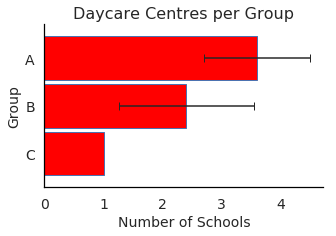

In [395]:
# Summarize number of schools of the 3 clusters
fig = plt.figure(figsize=(5, 3))

ax = stats_daycare['mean'].plot(kind='barh', width=0.92, color=['red'],fontsize=14,ec='b',xerr=stats_daycare['std'],capsize=4)
ax.set_title('Daycare Centres per Group',fontsize = 16)
ax.set_ylabel('Group',fontsize = 14)
ax.set_xlabel('Number of Schools',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

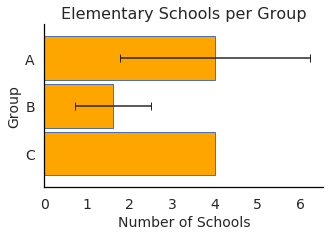

In [396]:
# Summarize number of schools of the 3 clusters
fig = plt.figure(figsize=(5, 3))

ax = stats_school['mean'].plot(kind='barh', width=0.92, color=['orange'],fontsize=14,ec='b',xerr=stats_school['std'],capsize=4)
ax.set_title('Elementary Schools per Group',fontsize = 16)
ax.set_ylabel('Group',fontsize = 14)
ax.set_xlabel('Number of Schools',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

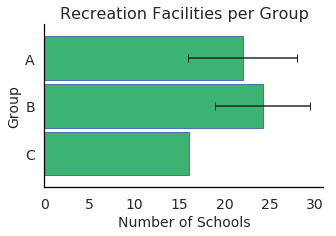

In [398]:
# Summarize number of recreational facilities of the 3 clusters
fig = plt.figure(figsize=(5, 3))

ax = stats_rec['mean'].plot(kind='barh', width=0.92, color=['mediumseagreen'],fontsize=14,ec='b',xerr=stats_rec['std'],capsize=4)
ax.set_title('Recreation Facilities per Group',fontsize = 16)
ax.set_ylabel('Group',fontsize = 14)
ax.set_xlabel('Number of Schools',fontsize = 14)
plt.gca().invert_yaxis()
ax.set_facecolor('w')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

#### Most neighbourhoods have at least one Martial Arts Dojo within biking distance (~10 min), except for Lakeview neighbourhood. Lakeview was removed, so 11 neighbourhoods remain.

In [309]:
# Create summary map_global view
map_goldenhorseshoe_7 = folium.Map(width=800,height=900,location=[43.4187, -79.7900], zoom_start=11,tiles='Stamen Toner')

# Add recreation facility markers:  
for lat, lng, venue, neighborhood in zip(top11_outdoors['Venue Latitude'], top11_outdoors['Venue Longitude'], top11_outdoors['Venue Category'], top11_outdoors['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='seagreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)
    
# Add daycare centre labels
for lat, lng, venue, neighborhood in zip(top11_daycare['Venue Latitude'], top11_daycare['Venue Longitude'], top11_daycare['Venue Category'], top11_daycare['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='red',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)  
    
# Add elementary school markers:   
for lat, lng, venue, neighborhood in zip(top11_school['Venue Latitude'], top11_school['Venue Longitude'], top11_school['Venue Category'], top11_school['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='orange',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)   
    
# Add martial arts dojo markers:
for lat, lng, venue, neighborhood in zip(Dojo_df['Venue Latitude'], Dojo_df['Venue Longitude'], Dojo_df['Venue Category'], Dojo_df['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=2,popup=label,color='limegreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)  

# add markers to the map, for KMeans Clustered neighbourhoods
rainbow = ['blue','mediumpurple']
markers_colors = []
for lat, lon, poi, cluster in zip(master_narrow['Latitude'], master_narrow['Longitude'], master_narrow['Neighbourhood'], master_narrow['KMeans Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],radius=5,popup=label,color=rainbow[cluster-1],fill=True,fill_color=rainbow[cluster-1],fill_opacity=1).add_to(map_goldenhorseshoe_7)
 
    
map_goldenhorseshoe_7

In [310]:
# Create summary map_global view
map_goldenhorseshoe_7 = folium.Map(width=1100,height=900,location=[43.4187, -79.7900], zoom_start=12,tiles='Stamen Toner')

# Add recreation facility markers:  
for lat, lng, venue, neighborhood in zip(top11_outdoors['Venue Latitude'], top11_outdoors['Venue Longitude'], top11_outdoors['Venue Category'], top11_outdoors['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=6,popup=label,color='seagreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)
    
# Add daycare centre labels
for lat, lng, venue, neighborhood in zip(top11_daycare['Venue Latitude'], top11_daycare['Venue Longitude'], top11_daycare['Venue Category'], top11_daycare['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=6,popup=label,color='red',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)  
    
# Add elementary school markers:   
for lat, lng, venue, neighborhood in zip(top11_school['Venue Latitude'], top11_school['Venue Longitude'], top11_school['Venue Category'], top11_school['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=6,popup=label,color='orange',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)   
    
# Add martial arts dojo markers:
for lat, lng, venue, neighborhood in zip(Dojo_df['Venue Latitude'], Dojo_df['Venue Longitude'], Dojo_df['Venue Category'], Dojo_df['Neighborhood']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],radius=6,popup=label,color='limegreen',
        fill=True,fill_opacity=0.7,parse_html=False).add_to(map_goldenhorseshoe_7)  

# add markers to the map, for KMeans Clustered neighbourhoods
rainbow = ['blue','mediumpurple']
markers_colors = []
for lat, lon, poi, cluster in zip(master_narrow['Latitude'], master_narrow['Longitude'], master_narrow['Neighbourhood'], master_narrow['KMeans Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],radius=10,popup=label,color=rainbow[cluster-1],fill=True,fill_color=rainbow[cluster-1],fill_opacity=1).add_to(map_goldenhorseshoe_7)
 
    
map_goldenhorseshoe_7


---

### 4.1 Summary of Results: Three Neighbourhood Groups

#### Group A: Mississauga-on-the-lake, east of the Credit River
The postal codes for this region are: L4Y, L5A, L5B, L5C, L5G
The neighbourhoods in this region are: Applewood, Dixie Creditview, Mississauga Valley, East Cooksville,  
  Fairview, City Centre, Mavis, Erindale, Southwest Lakeview, Mineola, East Port Credit

#### Group B: Burlington-on-the-lake, Oakville centre
The postal codes for this region are: L6K, L7L, L7M, L7N, L7R, L7S   
The neighbourhoods in this region are: Central Oakville, Elizabeth Gardens, Longmoor, Pinedale,  
  Shoreacres, Alton Village, Headon Forest, Palmer, Tansley Woods, Roseland, Dynes, Central, Plains, Maple

#### Group C: Dundas (west Hamilton)
The postal codes for this region is L9H 
The neighbourhoods in this region is Dundas

---

## 5. Discussion

Starting from 35 distinct macro-neighbourhoods, there remain 11 that meet the criteria of a young couple looking to move to the southwest shore of Lake Ontario. These 11 neighbourhoods are also clustered together and form 3 groups: 
  * Mississauga, near the lake (5 postal code regions)
  * Burlington, near the lake, and one neighbourhood of Oakville (6 postal code regions)
  * Dundas city, west Hamilton (one postal code)
   
These three different clusters vary slightly in the abundance of the key elements that the couple are looking for: (1) local daycare, (2) local elementary school, (3) high quantity and quality of recreational activites, and (4) an additional item; a local Martial Arts Dojo. Since 11 neighbourhoods meet this criteria, the couple can now focus on the particular recreational activities they prefer in the smaller communities within each of these neighbourhoods. This should save time and resources in approaching neighbourhood research as well as time spent at open houses and community events of neighbourhoods that are overall not a good fit for this particular couple.

Having three different large clusters of neighbourhoods is helpful, as it affords the couple more flexibility in finding a neighbourhood which also optimizes their working commute. This is largely the reason that the couple chose to not yet further reduce the number of desirable nieghbourhoods.

Other factors may play a role in the search of the ideal neighbourhood, such as housing costs, which was not factored into the present analysis. Housing costs can vary within communities due to the proximity to desirable features, waterfront and parks, or undesirable locations such as waste management facilities and high-traffic roads. Therefore, while this analysis provides a more focussed approach for starting to describe ideal neighbourhoods, further investigation is warranted to understand the regional differences within communities of each desirable neighbourhood. 

This analysis was conducted using data analytics provided by the Foursquare API. It is possible that daycare centres that are small or do not have an online precense could be missing from this analysis, which would exclude an entire neighbourhood. Foursquare data is also user generated, and so it is possible that the precense and absense of daycares centres and other similar facilities is different today during a global pandemic where multiple businesses are still currently closed. The couple will run this data analysis again later when more busnesses open up, to see if the results change.

---

## 6. Conclusion

In this present study, we used a data science approach to explore and select neighbourhoods based on the preferences of a young couple looking to buy their first home. We collected existing data using a postal code database as well as the Foursquare API. Based on these data and the ensuing data analytics, we were able to provide valuable information which would assist the couple in narrowing their search for a desirable neighbourhood.

We recognize this study is based on limited data and is also uniquely impacted by a global pandemic, which affects user generated data. However, this study provides a good initial starting point for considering the qualities of a desirable neighbourhood for a young couple who appreciate local amenities and outdoor activities. This analysis can be adapted to other cities around the globe by adapting the code presented above, and can be used for all sorts of factors that people require when considering a nieghbourhood that they would like to live in.
